# Import Cars Dataset

In [1]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    cars_files = np.array(data['filenames'])
    cars_targets = np_utils.to_categorical(np.array(data['target']), 4)
    return cars_files, cars_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('cars/train')
valid_files, valid_targets = load_dataset('cars/valid')
test_files, test_targets = load_dataset('cars/test')


#test_files9, test_targets9 = load_dataset('cars/test/2.90')


print(train_files)
print(train_targets)

# load list of dog names
cars_names = [item[13:-1] for item in sorted(glob("cars/train/*/"))]
print(cars_names)

# print statistics about the dataset
print('There are %d total cars image categories.' % len(cars_names))
print('There are %s total cars images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training cars images.' % len(train_files))
print('There are %d validation cars images.' % len(valid_files))
print('There are %d test cars images.'% len(test_files))

C:\Users\skhan\AppData\Local\Continuum\miniconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


['cars/train\\3.180\\106.jpg' 'cars/train\\3.180\\773.jpg'
 'cars/train\\1.0\\514.jpg' ... 'cars/train\\3.180\\149.jpg'
 'cars/train\\4.270\\289.jpg' 'cars/train\\4.270\\400.jpg']
[[0. 0. 1. 0.]
 [0. 0. 1. 0.]
 [1. 0. 0. 0.]
 ...
 [0. 0. 1. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]]
['0', '90', '180', '270']
There are 4 total cars image categories.
There are 3996 total cars images.

There are 3196 training cars images.
There are 404 validation cars images.
There are 396 test cars images.


# Pre-process the Data

In [2]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(299, 299))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

In [5]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|████████████████████████████████████████| 396/396 [00:04<00:00, 89.75it/s]


# Create the model and Train


In [18]:
import os
import sys
import glob
import argparse
import matplotlib.pyplot as plt

from keras import __version__
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import SGD
from keras.callbacks import ModelCheckpoint
from keras.callbacks import EarlyStopping
from keras.layers.normalization import BatchNormalization


IM_WIDTH, IM_HEIGHT = 299, 299 #fixed size for InceptionV3
NB_EPOCHS = 3
#BAT_SIZE = 32
FC_SIZE = 1024
NB_IV3_LAYERS_TO_FREEZE = 172
batch_size = 20

def setup_to_transfer_learn(model, base_model):
  #"""Freeze all layers and compile the model"""
  for layer in base_model.layers:
    layer.trainable = False    
  model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])


def add_new_last_layer(base_model, nb_classes):
  """Add last layer to the convnet
  Args:
    base_model: keras model excluding top
    nb_classes: # of classes
  Returns:
    new keras model with last layer
  """
  x = base_model.output
  x = GlobalAveragePooling2D()(x)
  x = Dense(FC_SIZE, activation='relu')(x) #new FC layer, random init
  x = BatchNormalization()(x)
  predictions = Dense(nb_classes, activation='softmax')(x) #new softmax layer
  model = Model(input=base_model.input, output=predictions)
  return model


def setup_to_finetune(model):
  """Freeze the bottom NB_IV3_LAYERS and retrain the remaining top layers.
  note: NB_IV3_LAYERS corresponds to the top 2 inception blocks in the inceptionv3 arch
  Args:
    model: keras model
  """
  for layer in model.layers[:NB_IV3_LAYERS_TO_FREEZE]:
     layer.trainable = False
    
  for layer in model.layers[NB_IV3_LAYERS_TO_FREEZE:]:
     layer.trainable = True
  
  sgd = SGD(lr=1e-3,  momentum=0.9, nesterov=True) # decay=1e-10,
  model.compile(optimizer=sgd, loss='categorical_crossentropy', metrics=['accuracy'])


  # data prep
train_datagen =  ImageDataGenerator(
      preprocessing_function=preprocess_input,
      rotation_range=30,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True
  )
test_datagen = ImageDataGenerator(
      preprocessing_function=preprocess_input,
      rotation_range=30,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True
  )

train_generator = train_datagen.flow_from_directory(
    'cars/train',
    target_size=(IM_WIDTH, IM_HEIGHT),
    batch_size=batch_size,
  )

validation_generator = test_datagen.flow_from_directory(
    'cars/valid',
    target_size=(IM_WIDTH, IM_HEIGHT),
    batch_size=batch_size,
  )

  # setup model
base_model = InceptionV3(weights='imagenet', include_top=False) #include_top=False excludes final FC layer
model = add_new_last_layer(base_model, 4)

  # transfer learning
setup_to_transfer_learn(model, base_model)

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.InceptionV3.hdf5', 
                               verbose=1, save_best_only=True)

#model.load_weights('saved_models/weights.best.InceptionV3.hdf5')

#early = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=1, mode='auto')

#history_tl = model.fit_generator(
#    train_generator,
#    nb_epoch=10,
#    samples_per_epoch=6680,
#    validation_data=validation_generator,
#    nb_val_samples=835,
#    verbose=1,
#    callbacks=[checkpointer, early],
#    class_weight='auto')

  # fine-tuning
setup_to_finetune(model)

model.load_weights("saved_models/weights.best.InceptionV3.hdf5")

early = EarlyStopping(monitor='val_loss', min_delta=0, patience=20, verbose=1, mode='auto')

model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)

model.save('inceptionv3-ft.model')

history_ft = model.fit_generator(
    train_generator,
    samples_per_epoch=3196,
    nb_epoch=10,
    verbose=1,
    validation_data=validation_generator,
    nb_val_samples=404 ,
    callbacks=[checkpointer, early],
    class_weight='auto')




Found 3196 images belonging to 4 classes.
Found 404 images belonging to 4 classes.


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:45: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("de...)`
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:142: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras.pre..., validation_data=<keras.pre..., callbacks=[<keras.ca..., class_weight="auto", validation_steps=404, verbose=1, epochs=10, steps_per_epoch=159)`


Epoch 1/10
159/159 [==============================] - 266s - loss: 0.3255 - acc: 0.8667 - val_loss: 0.3073 - val_acc: 0.8639
Epoch 2/10
159/159 [==============================] - 258s - loss: 0.3443 - acc: 0.8582 - val_loss: 0.2726 - val_acc: 0.8863
Epoch 3/10
159/159 [==============================] - 260s - loss: 0.2670 - acc: 0.8926 - val_loss: 0.2700 - val_acc: 0.8935
Epoch 4/10
159/159 [==============================] - 258s - loss: 0.2680 - acc: 0.8945 - val_loss: 0.2618 - val_acc: 0.8893
Epoch 5/10
159/159 [==============================] - 257s - loss: 0.2617 - acc: 0.8932 - val_loss: 0.2428 - val_acc: 0.8983
Epoch 6/10
159/159 [==============================] - 256s - loss: 0.2358 - acc: 0.9061 - val_loss: 0.2540 - val_acc: 0.8886
Epoch 7/10
159/159 [==============================] - 255s - loss: 0.2395 - acc: 0.9042 - val_loss: 0.2737 - val_acc: 0.8870
Epoch 8/10
159/159 [==============================] - 257s - loss: 0.2243 - acc: 0.9070 - val_loss: 0.2405 - val_acc: 0.8983


In [3]:
from keras.models import model_from_json

json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("saved_models/weights.best.InceptionV3.hdf5")

model= loaded_model

predictions = [np.argmax(model.predict(np.expand_dims(feature, axis=0))) for feature in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(predictions)==np.argmax(test_targets, axis=1))/len(predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

NameError: name 'test_tensors' is not defined

In [4]:
 from keras.models import model_from_json

 json_file = open('model.json', 'r')
 loaded_model_json = json_file.read()
 json_file.close()
 loaded_model = model_from_json(loaded_model_json)
 # load weights into new model
 loaded_model.load_weights("saved_models/weights.best.InceptionV3.hdf5")
 model= loaded_model

In [10]:
#from extract_bottleneck_features import *

def predict_orientation(img_path):
    # extract bottleneck features
    bottleneck_feature = path_to_tensor(img_path).astype('float32')/255
    #print(bottleneck_feature)
    # obtain predicted vector
    
    predicted_vector = model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    #print(predicted_vector.shape)
    #print(predicted_vector)
    #print(np.argmax(predicted_vector))
    #print(predicted_vector[0,np.argmax(predicted_vector)])
    return int(cars_names[np.argmax(predicted_vector)]), predicted_vector[0,np.argmax(predicted_vector)] 

In [6]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

def make_prediction(path):   
    return predict_orientation(path)   
   

In [7]:
import os
import cv2
import numpy as np
import argparse

def rotateImage3(mat, angle):
    # angle in degrees
    #mat = cv2.imread(path)
    height, width = mat.shape[:2]
    image_center = (width / 2, height / 2)

    rotation_mat = cv2.getRotationMatrix2D(image_center, angle, 1.)

    abs_cos = abs(rotation_mat[0, 0])
    abs_sin = abs(rotation_mat[0, 1])

    bound_w = int(height * abs_sin + width * abs_cos)
    bound_h = int(height * abs_cos + width * abs_sin)

    rotation_mat[0, 2] += bound_w / 2 - image_center[0]
    rotation_mat[1, 2] += bound_h / 2 - image_center[1]

    rotated_mat = cv2.warpAffine(mat, rotation_mat, (bound_w, bound_h))

    #cv2.imwrite(dest, rotated_mat)
    
    return rotated_mat

def rotateImage(path, angle, dest):
    # angle in degrees
    mat = cv2.imread(path)
    height, width = mat.shape[:2]
    image_center = (width / 2, height / 2)

    rotation_mat = cv2.getRotationMatrix2D(image_center, angle, 1.)

    abs_cos = abs(rotation_mat[0, 0])
    abs_sin = abs(rotation_mat[0, 1])

    bound_w = int(height * abs_sin + width * abs_cos)
    bound_h = int(height * abs_cos + width * abs_sin)

    rotation_mat[0, 2] += bound_w / 2 - image_center[0]
    rotation_mat[1, 2] += bound_h / 2 - image_center[1]

    rotated_mat = cv2.warpAffine(mat, rotation_mat, (bound_w, bound_h))

    cv2.imwrite(dest, rotated_mat)
    
    
def rotateImage2(path, angle, dest, center = None, scale = 1.0):
    image = cv2.imread(path)
    (h, w) = image.shape[:2]

    if center is None:
        center = (w / 2, h / 2)

    # Perform the rotation
    M = cv2.getRotationMatrix2D(center, angle, scale)
    rotated = cv2.warpAffine(image, M, (w, h))
    
    cv2.imwrite(dest, rotated)
    

In [11]:
f = 'C:\DL\image orientation\images'

In [140]:
from random import *

for filename in os.listdir(f):
    r = randint(1, 3)
    if r==1:
         rotateImage(f+'/'+filename, 90, f+'/'+filename)
    elif r==2:
        rotateImage(f+'/'+filename, 180, f+'/'+filename)
    else:
        rotateImage(f+'/'+filename, 270, f+'/'+filename)

In [8]:
def ManageRotation(path, angle):
    angle, confidence = make_prediction(path)
    rotateImage(path, int(angle), path)
    
    tempC = 0
    bestAngle = 0
    if angle==0:
        tempC = confidence
        bestAngle = 0
        
    trial = 1;     
    while trial<4:
        angle, confidence = make_prediction(path)
        if angle>0:
            rotateImage(path, 90, path)
            bestAngle += 90
        elif tempC<confidence:
            tempC = confidence   
            bestAngle = 0        
            
        trial = trial+1
    
    rotateImage(path, bestAngle, path)    

In [117]:

# import os
# import matplotlib.pyplot as plt
# f = 'C:\DL\image orientation\images'
# for filename in os.listdir(f):
#     img = mpimg.imread(f+'/'+filename)    
#     plt.imshow(img)
#     p,c = make_prediction(f+'/'+filename)
#     #print(filename +'-----' + str(p))
#     trial = 0;    
#     if int(p)>0:
#         while trial<10:
#             rotateImage(f+'/'+filename, int(p), f+'/'+filename)
#             trial = trial +1
#             p,c = make_prediction(f+'/'+filename)
#             #print(str(trial) + '-----'+str(p))
#             if int(p)==0:
#                 break           
                

In [7]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
%matplotlib inline  
def showImg(path):
    img = mpimg.imread(path)   
    plt.axis('off')
    plt.imshow(img)

In [9]:
print('before rotation')
showImg('images/1.jpg')   
angle, confidence = make_prediction('images/1.jpg')
print(str(angle) +' : '+ str(confidence * 100))  


before rotation


NameError: name 'showImg' is not defined

after rotation


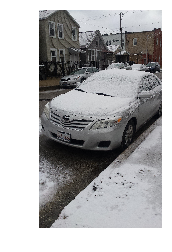

In [144]:
angle, confidence = make_prediction('images/1.jpg')
ManageRotation('images/1.jpg', angle)
#rotateImage('images/1.jpg', int(angle), 'images/1.jpg')
print('after rotation')
showImg('images/1.jpg') 

before rotation
180 : 99.340057373


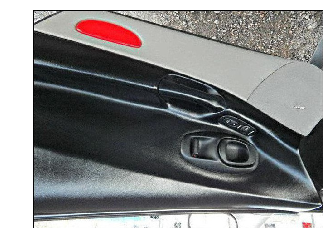

In [145]:
print('before rotation')
showImg('images/2.jpg')   
angle, confidence = make_prediction('images/2.jpg')
print(str(angle) +' : '+ str(confidence * 100))  

after rotation


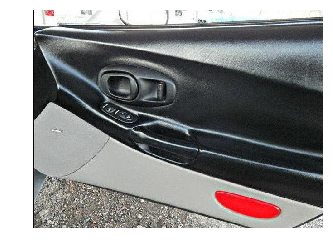

In [146]:
angle, confidence = make_prediction('images/2.jpg')
ManageRotation('images/2.jpg', int(angle))
print('after rotation')
showImg('images/2.jpg') 

before rotation
180 : 97.1929609776


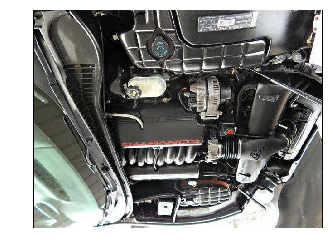

In [148]:
print('before rotation')
showImg('images/3.jpg')   
angle, confidence = make_prediction('images/3.jpg')
print(str(angle) +' : '+ str(confidence * 100))  

after rotation


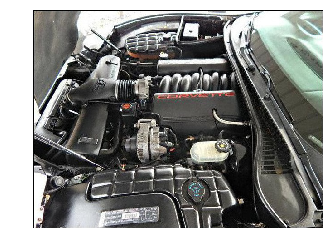

In [149]:
angle, confidence = make_prediction('images/3.jpg')
ManageRotation('images/3.jpg', int(angle))#, 'images/3.jpg')
print('after rotation')
showImg('images/3.jpg') 

before rotation
90 : 82.177400589


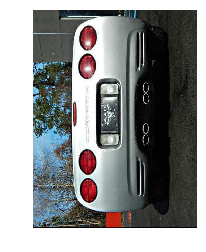

In [150]:
print('before rotation')
showImg('images/4.jpg')   
angle, confidence = make_prediction('images/4.jpg')
print(str(angle) +' : '+ str(confidence * 100))  

after rotation


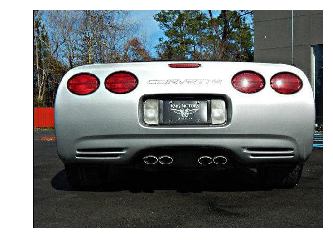

In [151]:
angle, confidence = make_prediction('images/4.jpg')
ManageRotation('images/4.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/4.jpg') 

before rotation
180 : 98.61561656


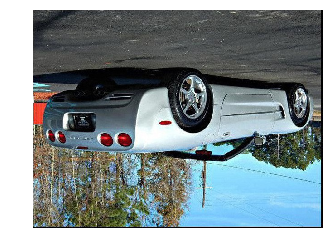

In [152]:
print('before rotation')
showImg('images/5.jpg')   
angle, confidence = make_prediction('images/5.jpg')
print(str(angle) +' : '+ str(confidence * 100))  

after rotation


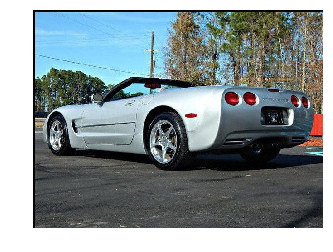

In [153]:
angle, confidence = make_prediction('images/5.jpg')
ManageRotation('images/5.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/5.jpg') 

before rotation
90 : 55.709028244


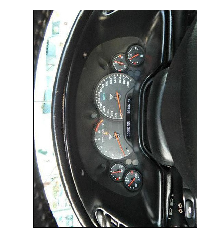

In [154]:
print('before rotation')
showImg('images/6.jpg')   
angle, confidence = make_prediction('images/6.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


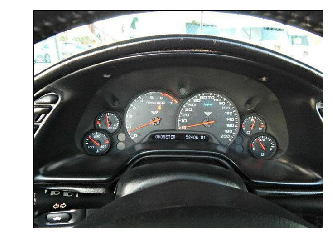

In [155]:
angle, confidence = make_prediction('images/6.jpg')
ManageRotation('images/6.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/6.jpg') 

before rotation
270 : 53.3887445927


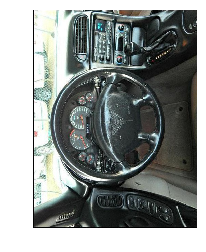

In [156]:
print('before rotation')
showImg('images/7.jpg')   
angle, confidence = make_prediction('images/7.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


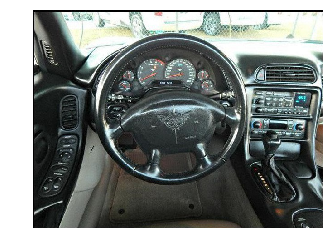

In [157]:
angle, confidence = make_prediction('images/7.jpg')
ManageRotation('images/7.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/7.jpg') 

before rotation
270 : 63.3651673794


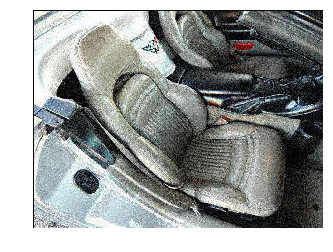

In [158]:
print('before rotation')
showImg('images/8.jpg')   
angle, confidence = make_prediction('images/8.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


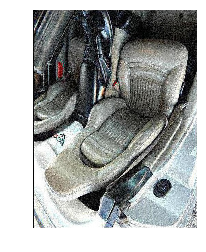

In [159]:
angle, confidence = make_prediction('images/8.jpg')
ManageRotation('images/8.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/8.jpg') 

before rotation
90 : 98.1232881546


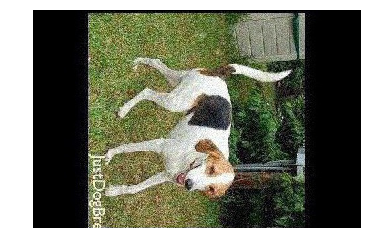

In [160]:
print('before rotation')
showImg('images/9.jpg')   
angle, confidence = make_prediction('images/9.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


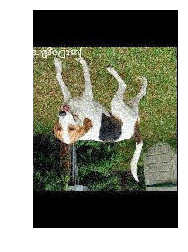

In [161]:
angle, confidence = make_prediction('images/9.jpg')
ManageRotation('images/9.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/9.jpg') 

before rotation
180 : 99.8003184795


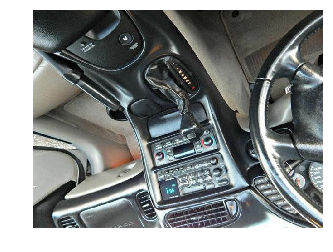

In [162]:
print('before rotation')
showImg('images/11.jpg')   
angle, confidence = make_prediction('images/11.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


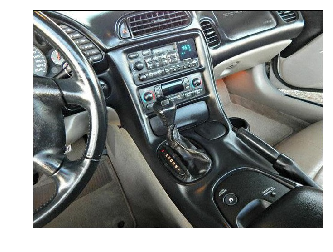

In [163]:
angle, confidence = make_prediction('images/11.jpg')
ManageRotation('images/11.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/11.jpg') 

before rotation
90 : 89.0295386314


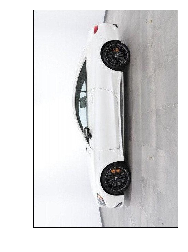

In [164]:
print('before rotation')
showImg('images/12.jpg')   
angle, confidence = make_prediction('images/12.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


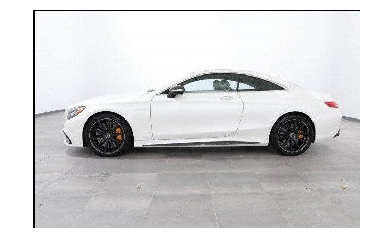

In [165]:
angle, confidence = make_prediction('images/12.jpg')
ManageRotation('images/12.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/12.jpg') 

before rotation
180 : 64.1515374184


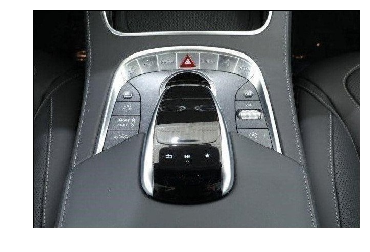

In [166]:
print('before rotation')
showImg('images/14.jpg')   
angle, confidence = make_prediction('images/14.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


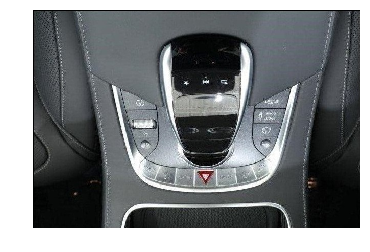

In [167]:
angle, confidence = make_prediction('images/14.jpg')
ManageRotation('images/14.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/14.jpg') 

before rotation
180 : 98.8660097122


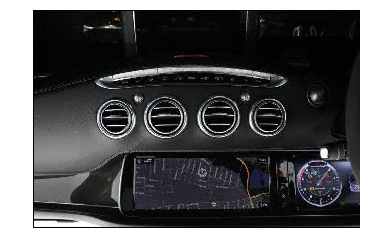

In [168]:
print('before rotation')
showImg('images/15.jpg')   
angle, confidence = make_prediction('images/15.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


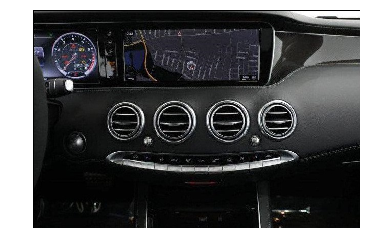

In [169]:
angle, confidence = make_prediction('images/15.jpg')
ManageRotation('images/15.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/15.jpg') 

before rotation
270 : 92.0619726181


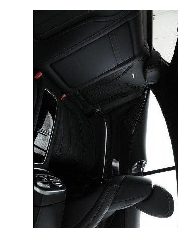

In [170]:
print('before rotation')
showImg('images/16.jpg')   
angle, confidence = make_prediction('images/16.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


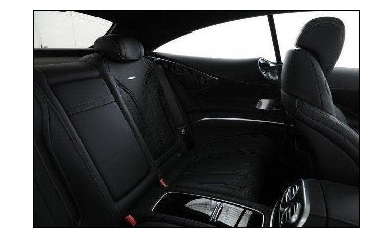

In [171]:
angle, confidence = make_prediction('images/16.jpg')
ManageRotation('images/16.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/16.jpg') 

before rotation
180 : 81.5004944801


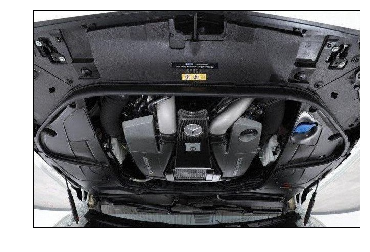

In [172]:
print('before rotation')
showImg('images/17.jpg')   
angle, confidence = make_prediction('images/17.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


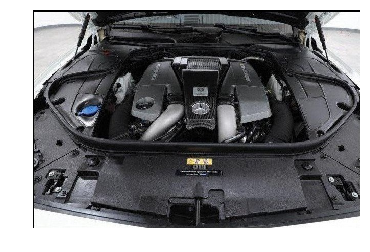

In [173]:
angle, confidence = make_prediction('images/17.jpg')
ManageRotation('images/17.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/17.jpg') 

before rotation
270 : 50.0147104263


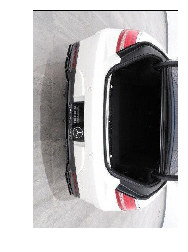

In [174]:
print('before rotation')
showImg('images/18.jpg')   
angle, confidence = make_prediction('images/18.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


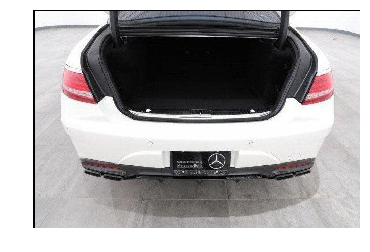

In [175]:
angle, confidence = make_prediction('images/18.jpg')
ManageRotation('images/18.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/18.jpg') 

before rotation
90 : 68.3826506138


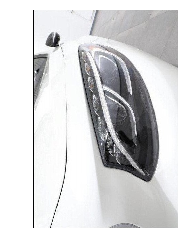

In [176]:
print('before rotation')
showImg('images/19.jpg')   
angle, confidence = make_prediction('images/19.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


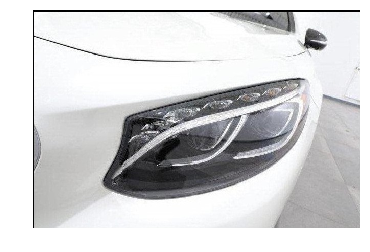

In [177]:
angle, confidence = make_prediction('images/19.jpg')
ManageRotation('images/19.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/19.jpg') 

before rotation
270 : 81.6253602505


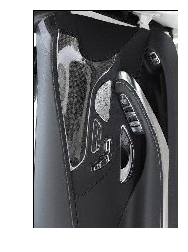

In [178]:
print('before rotation')
showImg('images/20.jpg')   
angle, confidence = make_prediction('images/20.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


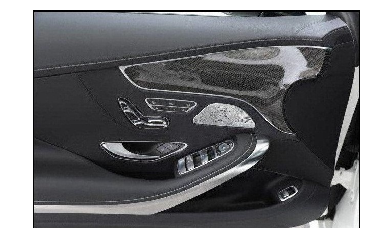

In [179]:
angle, confidence = make_prediction('images/20.jpg')
ManageRotation('images/20.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/20.jpg') 

before rotation
180 : 97.1927702427


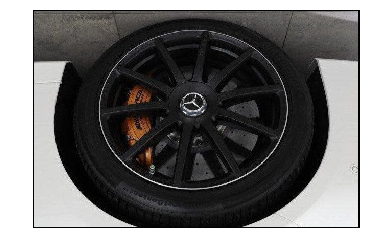

In [180]:
print('before rotation')
showImg('images/21.jpg')   
angle, confidence = make_prediction('images/21.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


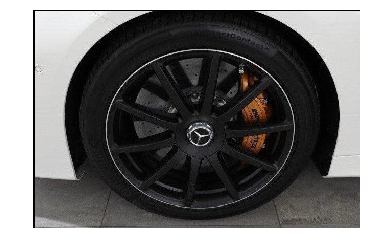

In [181]:
angle, confidence = make_prediction('images/21.jpg')
ManageRotation('images/21.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/21.jpg') 

before rotation
180 : 74.4995713234


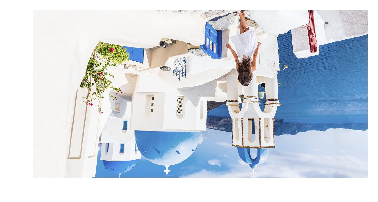

In [182]:
print('before rotation')
showImg('images/greece.jpg')   
angle, confidence = make_prediction('images/greece.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


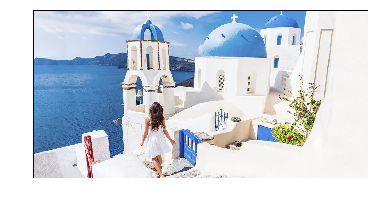

In [183]:
angle, confidence = make_prediction('images/greece.jpg')
ManageRotation('images/greece.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/greece.jpg') 

before rotation
90 : 94.5191323757


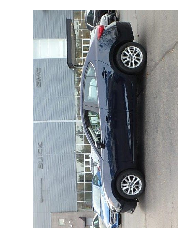

In [185]:
print('before rotation')
showImg('images/22.jpg')   
angle, confidence = make_prediction('images/22.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


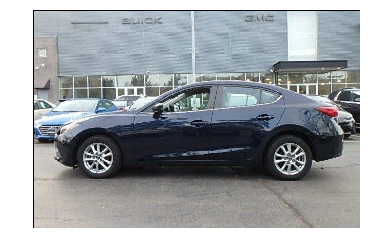

In [186]:
angle, confidence = make_prediction('images/22.jpg')
ManageRotation('images/22.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/22.jpg') 

before rotation
90 : 54.9575150013


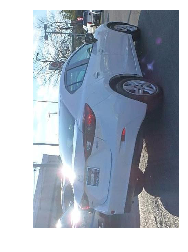

In [188]:
print('before rotation')
showImg('images/23.jpg')   
angle, confidence = make_prediction('images/23.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


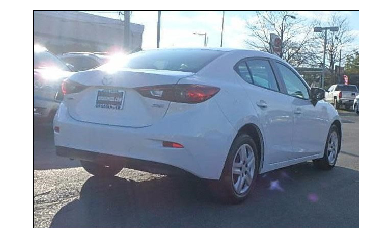

In [189]:
angle, confidence = make_prediction('images/23.jpg')
ManageRotation('images/23.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/23.jpg') 

before rotation
90 : 92.2889113426


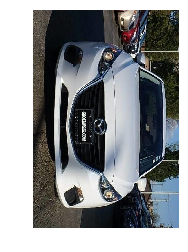

In [191]:
print('before rotation')
showImg('images/24.jpg')   
angle, confidence = make_prediction('images/24.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


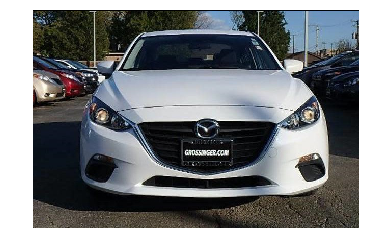

In [192]:
angle, confidence = make_prediction('images/24.jpg')
ManageRotation('images/24.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/24.jpg') 

before rotation
180 : 99.7263431549


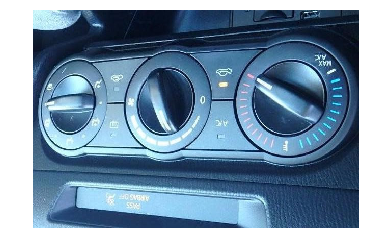

In [195]:
print('before rotation')
showImg('images/25.jpg')   
angle, confidence = make_prediction('images/25.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


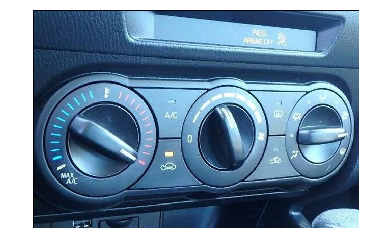

In [196]:
angle, confidence = make_prediction('images/25.jpg')
ManageRotation('images/25.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/25.jpg') 

before rotation
180 : 78.7509799004


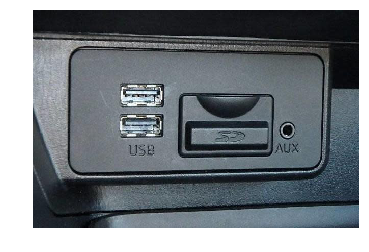

In [197]:
print('before rotation')
showImg('images/26.jpg')   
angle, confidence = make_prediction('images/26.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


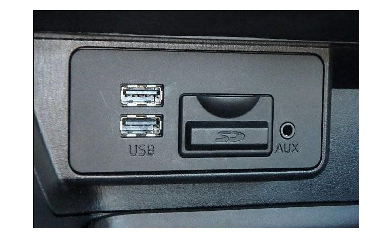

In [198]:
angle, confidence = make_prediction('images/26.jpg')
ManageRotation('images/26.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/26.jpg') 

before rotation
90 : 88.3539438248


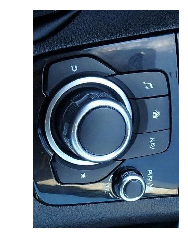

In [199]:
print('before rotation')
showImg('images/27.jpg')   
angle, confidence = make_prediction('images/27.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


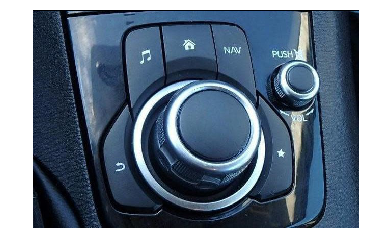

In [200]:
angle, confidence = make_prediction('images/27.jpg')
ManageRotation('images/27.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/27.jpg') 

before rotation
270 : 73.9910125732


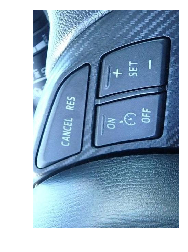

In [202]:
print('before rotation')
showImg('images/28.jpg')   
angle, confidence = make_prediction('images/28.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


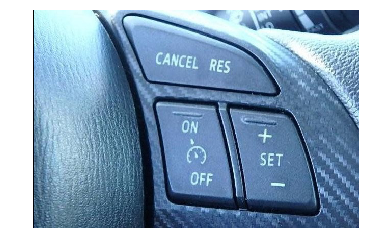

In [204]:
angle, confidence = make_prediction('images/28.jpg')
ManageRotation('images/28.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/28.jpg') 

before rotation
180 : 68.630874157


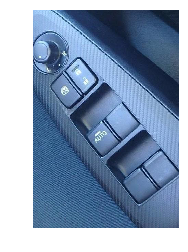

In [205]:
print('before rotation')
showImg('images/29.jpg')   
angle, confidence = make_prediction('images/29.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


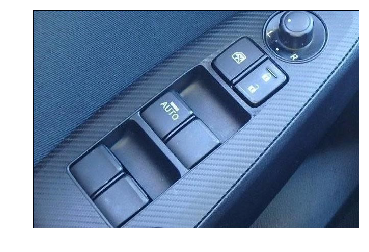

In [206]:
angle, confidence = make_prediction('images/29.jpg')
ManageRotation('images/29.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/29.jpg') 

before rotation
180 : 99.2260396481


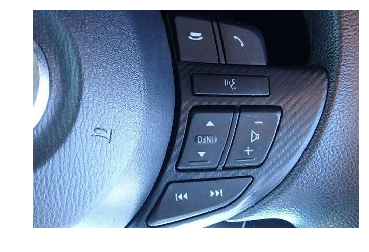

In [209]:
print('before rotation')
showImg('images/30.jpg')   
angle, confidence = make_prediction('images/30.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


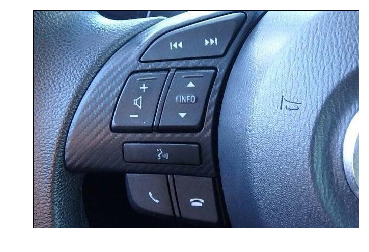

In [210]:
angle, confidence = make_prediction('images/30.jpg')
ManageRotation('images/30.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/30.jpg') 

before rotation
90 : 50.2610146999


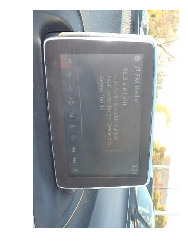

In [212]:
print('before rotation')
showImg('images/31.jpg')   
angle, confidence = make_prediction('images/31.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


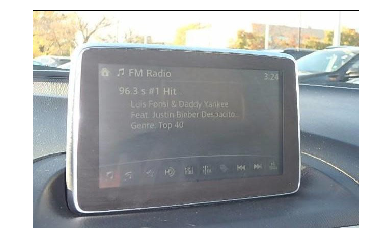

In [213]:
angle, confidence = make_prediction('images/31.jpg')
ManageRotation('images/31.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/31.jpg') 

before rotation
90 : 70.7464456558


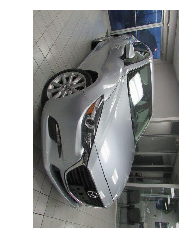

In [215]:
print('before rotation')
showImg('images/32.jpg')   
angle, confidence = make_prediction('images/32.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


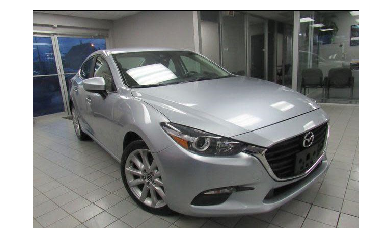

In [216]:
angle, confidence = make_prediction('images/32.jpg')
ManageRotation('images/32.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/32.jpg') 

before rotation
270 : 99.1414248943


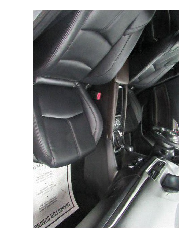

In [225]:
print('before rotation')
showImg('images/33.jpg')   
angle, confidence = make_prediction('images/33.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


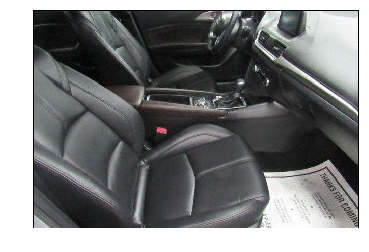

In [226]:
angle, confidence = make_prediction('images/33.jpg')
ManageRotation('images/33.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/33.jpg') 

before rotation
270 : 93.8199400902


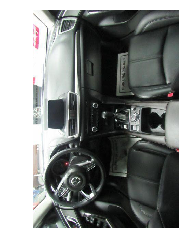

In [228]:
print('before rotation')
showImg('images/34.jpg')   
angle, confidence = make_prediction('images/34.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


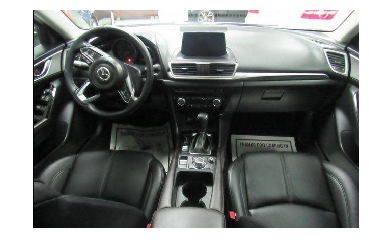

In [229]:
angle, confidence = make_prediction('images/34.jpg')
ManageRotation('images/34.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/34.jpg') 

before rotation
270 : 85.4261577129


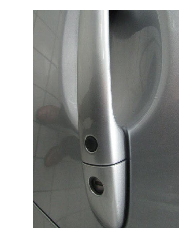

In [232]:
print('before rotation')
showImg('images/35.jpg')   
angle, confidence = make_prediction('images/35.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


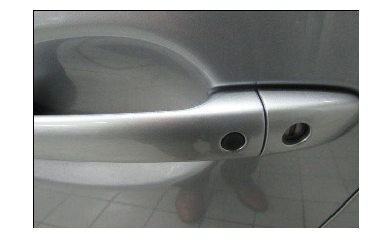

In [233]:
angle, confidence = make_prediction('images/35.jpg')
ManageRotation('images/35.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/35.jpg') 

before rotation
270 : 51.2768030167


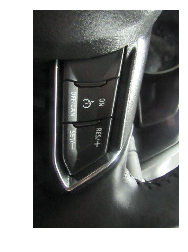

In [235]:
print('before rotation')
showImg('images/36.jpg')   
angle, confidence = make_prediction('images/36.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


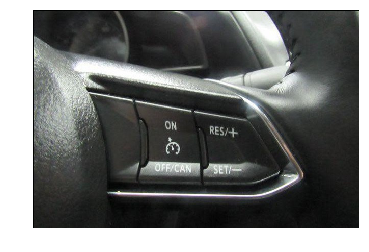

In [237]:
angle, confidence = make_prediction('images/36.jpg')
ManageRotation('images/36.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/36.jpg') 

before rotation
270 : 85.5232894421


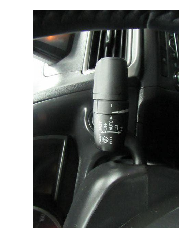

In [240]:
print('before rotation')
showImg('images/37.jpg')   
angle, confidence = make_prediction('images/37.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


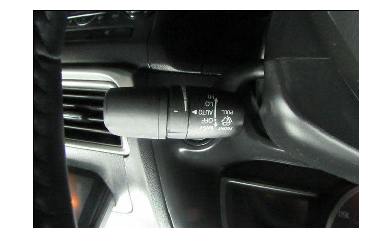

In [241]:
angle, confidence = make_prediction('images/37.jpg')
ManageRotation('images/37.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/37.jpg') 

before rotation
180 : 99.3054807186


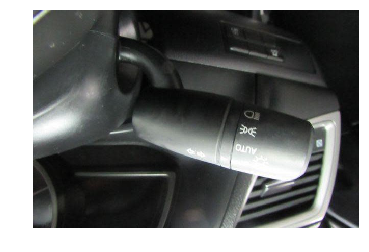

In [243]:
print('before rotation')
showImg('images/38.jpg')   
angle, confidence = make_prediction('images/38.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


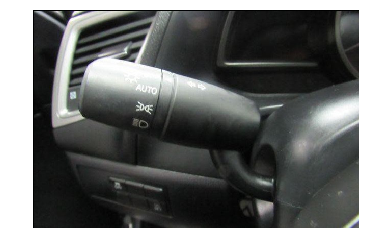

In [244]:
angle, confidence = make_prediction('images/38.jpg')
ManageRotation('images/38.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/38.jpg') 

before rotation
180 : 99.2325901985


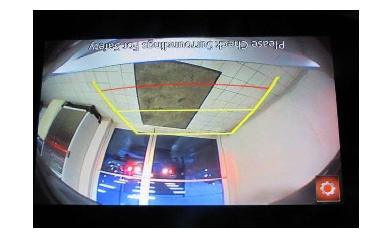

In [246]:
print('before rotation')
showImg('images/39.jpg')   
angle, confidence = make_prediction('images/39.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


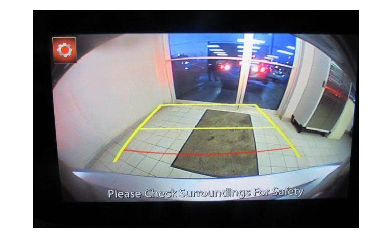

In [250]:
angle, confidence = make_prediction('images/39.jpg')
ManageRotation('images/39.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/39.jpg')

before rotation
0 : 99.4832158089


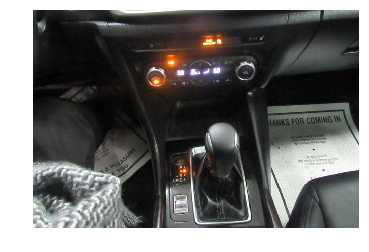

In [251]:
print('before rotation')
showImg('images/40.jpg')   
angle, confidence = make_prediction('images/40.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


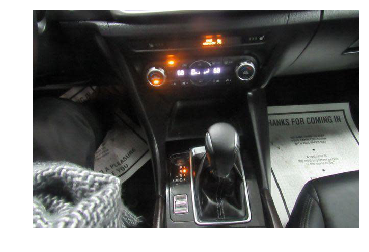

In [252]:
angle, confidence = make_prediction('images/40.jpg')
ManageRotation('images/40.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/40.jpg')

before rotation
90 : 71.3928222656


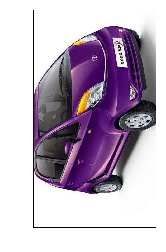

In [18]:
print('before rotation')
showImg('images/41.jpg')   
angle, confidence = make_prediction('images/41.jpg')
print(str(angle) +' : '+ str(confidence * 100)) 

after rotation


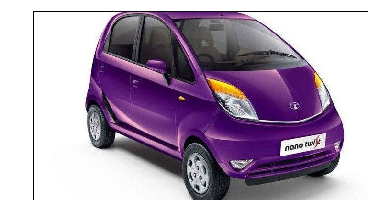

In [19]:
angle, confidence = make_prediction('images/41.jpg')
ManageRotation('images/41.jpg', int(angle))#, 'images/4.jpg')
print('after rotation')
showImg('images/41.jpg')